# Support Vector Machine (SVM) com banco de dados do Spotify

In [39]:
# importanto bilbiotecas
from sklearn import svm
from sklearn import metrics
from sklearn.model_selection import cross_val_predict
from sklearn import datasets

import seaborn as sns

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

### A base de dados de **músicas do Spotify**


In [97]:
dataset=pd.read_csv('data.csv',sep=',')
dataset.head()

,id,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


In [3]:
dataset.isnull().sum()

id                  0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
speechiness         0
tempo               0
time_signature      0
valence             0
target              0
song_title          0
artist              0
dtype: int64

In [4]:
dataset.describe()

,id,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target
count,2017.000000,2017.000000,2017.000000,2.017000e+03,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000,2017.000000
mean,1008.000000,0.187590,0.618422,2.463062e+05,0.681577,0.133286,5.342588,0.190844,-7.085624,0.612295,0.092664,121.603272,3.968270,0.496815,0.505702
std,582.402066,0.259989,0.161029,8.198181e+04,0.210273,0.273162,3.648240,0.155453,3.761684,0.487347,0.089931,26.685604,0.255853,0.247195,0.500091
min,0.000000,0.000003,0.122000,1.604200e+04,0.014800,0.000000,0.000000,0.018800,-33.097000,0.000000,0.023100,47.859000,1.000000,0.034800,0.000000
25%,504.000000,0.009630,0.514000,2.000150e+05,0.563000,0.000000,2.000000,0.092300,-8.394000,0.000000,0.037500,100.189000,4.000000,0.295000,0.000000
50%,1008.000000,0.063300,0.631000,2.292610e+05,0.715000,0.000076,6.000000,0.127000,-6.248000,1.000000,0.054900,121.427000,4.000000,0.492000,1.000000
75%,1512.000000,0.265000,0.738000,2.703330e+05,0.846000,0.054000,9.000000,0.247000,-4.746000,1.000000,0.108000,137.849000,4.000000,0.691000,1.000000
max,2016.000000,0.995000,0.984000,1.004627e+06,0.998000,0.976000,11.000000,0.969000,-0.307000,1.000000,0.816000,219.331000,5.000000,0.992000,1.000000


In [5]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2017 entries, 0 to 2016
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                2017 non-null   int64  
 1   acousticness      2017 non-null   float64
 2   danceability      2017 non-null   float64
 3   duration_ms       2017 non-null   int64  
 4   energy            2017 non-null   float64
 5   instrumentalness  2017 non-null   float64
 6   key               2017 non-null   int64  
 7   liveness          2017 non-null   float64
 8   loudness          2017 non-null   float64
 9   mode              2017 non-null   int64  
 10  speechiness       2017 non-null   float64
 11  tempo             2017 non-null   float64
 12  time_signature    2017 non-null   float64
 13  valence           2017 non-null   float64
 14  target            2017 non-null   int64  
 15  song_title        2017 non-null   object 
 16  artist            2017 non-null   object 


# Pandas profiling

In [6]:
from pandas_profiling import ProfileReport

In [7]:
relatorio = ProfileReport(dataset, title='Relatório de Músicas')
relatorio.to_file('relatorio_musicas.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
relatorio

In [9]:
dataset.columns

Index(['id', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'target',
       'song_title', 'artist'],
      dtype='object')

 ### Relação acousticness X danceability

<IPython.core.display.Javascript object>


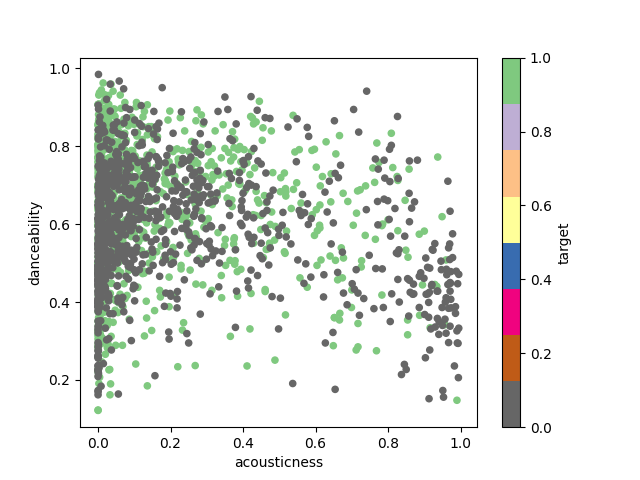

<AxesSubplot:xlabel='acousticness', ylabel='danceability'>

In [17]:
%matplotlib notebook
plt.style.use('seaborn-colorblind')
dataset.plot(x='acousticness',y='danceability',c='target',kind='scatter',colormap='Accent_r')

 ### Relação danceability X energy

<IPython.core.display.Javascript object>


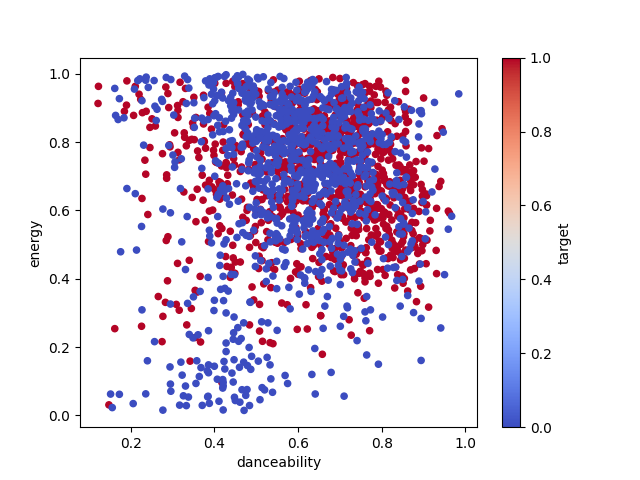

<AxesSubplot:xlabel='danceability', ylabel='energy'>

In [20]:
%matplotlib notebook
plt.style.use('seaborn-colorblind')
dataset.plot(x='danceability',y='energy',c='target',kind='scatter',colormap='coolwarm')

 ### Relação valence X target

<IPython.core.display.Javascript object>


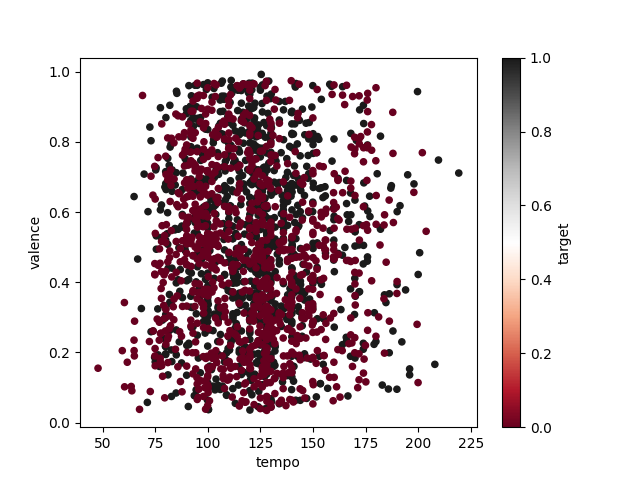

<AxesSubplot:xlabel='tempo', ylabel='valence'>

In [21]:
%matplotlib notebook
plt.style.use('seaborn-colorblind')
dataset.plot(x='tempo',y='valence',c='target',kind='scatter',colormap='RdGy')

 ### Relação tempo X speechiness

<IPython.core.display.Javascript object>


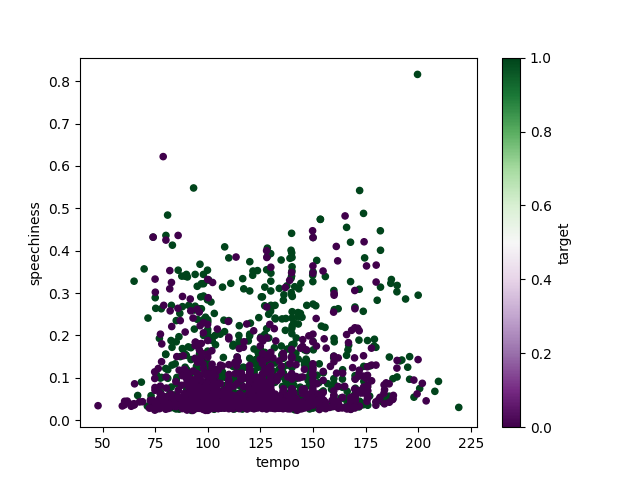

<AxesSubplot:xlabel='tempo', ylabel='speechiness'>

In [22]:
%matplotlib notebook
plt.style.use('seaborn-colorblind')
dataset.plot(x='tempo',y='speechiness',c='target',kind='scatter',colormap='PRGn')

In [ ]:
sns.pairplot(dataset,hue='clique')

In [23]:
dataset.head()

,id,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,target,song_title,artist
0,0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,1,Mask Off,Future
1,1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,1,Redbone,Childish Gambino
2,2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,1,Xanny Family,Future
3,3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,1,Master Of None,Beach House
4,4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,1,Parallel Lines,Junior Boys


In [37]:
data=dataset[['acousticness','danceability','duration_ms' ,'energy' ,'instrumentalness','loudness',
            'speechiness','tempo','valence','target']]

<IPython.core.display.Javascript object>


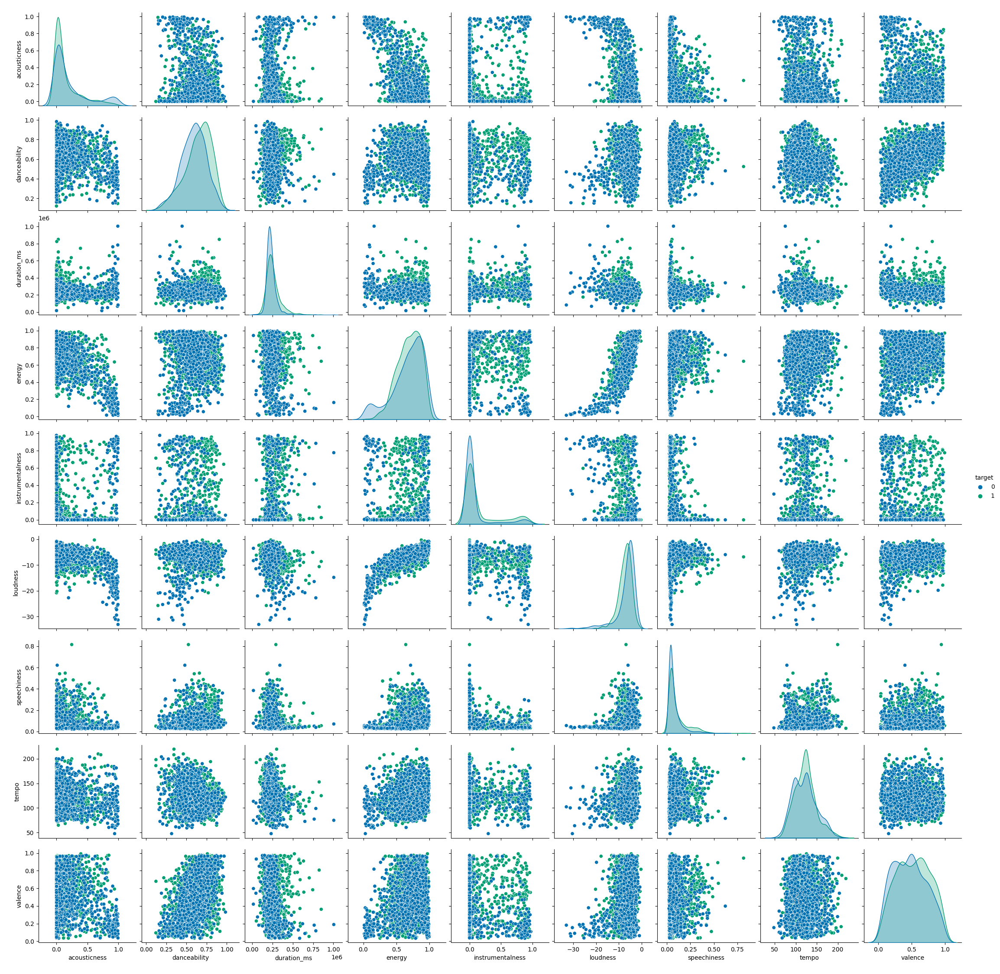

In [40]:
sns.pairplot(data,hue='target',)

### Separação das classes e features

In [98]:
from sklearn.model_selection import cross_val_score

In [99]:
def Acuracia(clf,X,y):
    resultados = cross_val_predict(clf, X, y, cv=10)
    return metrics.accuracy_score(y,resultados)

Aqui será separado as features (dataset) que é utilizado para classificar o algoritmo e a classe que é a verdadeira separação

In [100]:
classe=dataset['target']

In [46]:
def retirar(ind):
    for i in ind:
        dataset.drop(i,axis=1,inplace=True)
    return "Ok"

In [101]:
retirar(['song_title','id','target'])
dataset.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,artist
0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,150.062,4.0,0.286,Future
1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,160.083,4.0,0.588,Childish Gambino
2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,75.044,4.0,0.173,Future
3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,86.468,4.0,0.230,Beach House
4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,174.004,4.0,0.904,Junior Boys


### Aqui será codificado os artistas: Transforma os nomes em vetores 

In [102]:
dataset = pd.get_dummies(dataset, columns=['artist'], prefix=['artist'])
dataset.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,...,artist_alt-J,artist_deadmau5,artist_for KING & COUNTRY,artist_one sonic society,artist_tUnE-yArDs,artist_tobyMac,artist_권나무 Kwon Tree,artist_도시총각 Dosichonggak,artist_카우칩스 The CowChips,artist_플랫핏 Flat Feet
0,0.0102,0.833,204600,0.434,0.021900,2,0.1650,-8.795,1,0.4310,...,0,0,0,0,0,0,0,0,0,0
1,0.1990,0.743,326933,0.359,0.006110,1,0.1370,-10.401,1,0.0794,...,0,0,0,0,0,0,0,0,0,0
2,0.0344,0.838,185707,0.412,0.000234,2,0.1590,-7.148,1,0.2890,...,0,0,0,0,0,0,0,0,0,0
3,0.6040,0.494,199413,0.338,0.510000,5,0.0922,-15.236,1,0.0261,...,0,0,0,0,0,0,0,0,0,0
4,0.1800,0.678,392893,0.561,0.512000,5,0.4390,-11.648,0,0.0694,...,0,0,0,0,0,0,0,0,0,0


In [103]:
dataset.columns

Index(['acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness',
       ...
       'artist_alt-J', 'artist_deadmau5', 'artist_for KING & COUNTRY',
       'artist_one sonic society', 'artist_tUnE-yArDs', 'artist_tobyMac',
       'artist_권나무 Kwon Tree', 'artist_도시총각 Dosichonggak',
       'artist_카우칩스 The CowChips', 'artist_플랫핏 Flat Feet'],
      dtype='object', length=1356)

## Pipeline

In [104]:
def Acuracia(clf,X,y):
    resultados = cross_val_predict(clf, X, y, cv=10)
    return metrics.accuracy_score(y,resultados)

In [105]:
# Importe as bibliotecas de Pipelines e Pré-processadores
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [106]:
# Treinando o algoritmo de SVM.
clf = svm.SVC().fit(dataset,classe)

In [107]:
Acuracia(clf,dataset,classe)

0.5577590480912246

### Criando as pipelines

In [110]:
# Criando pipeline

pip_1 = Pipeline([
    ('scaler',StandardScaler()),
    ('clf', svm.SVC(kernel='rbf'))
])

pip_2=  Pipeline([
    ('min_max_scaler',MinMaxScaler()),
    ('clf', svm.SVC())
])


pip_3=  Pipeline([
    ('scaler',StandardScaler()),
    ('clf', svm.SVC(kernel='poly'))
])


pip_4=  Pipeline([
    ('scaler',StandardScaler()),
    ('clf', svm.SVC(kernel='linear'))
])



## Testando o desempenho dos pips

In [113]:
# Chama a função acuracia passando os dados de musicas e as classes
# Usando o pipeline pip_1

Acuracia(pip_1,dataset,classe)

0.58601883986118

In [114]:
#pip2
Acuracia(pip_2,dataset,classe)

0.7223599405057015

In [115]:
#pip3
Acuracia(pip_3,dataset,classe)

0.5751115518096183

In [116]:
#pip4
Acuracia(pip_4,dataset,classe)

0.6058502726822013

## Testando os dados com divisão entre treino e teste

In [117]:
from sklearn.model_selection import train_test_split

In [118]:
X_train, X_test, y_train, y_test = train_test_split(dataset, classe, test_size=0.2, random_state=123)

### Utilizando scaler como pre-processamento dos dados


In [121]:

scaler = StandardScaler().fit(X_train)
X_train = scaler.transform(X_train)

scaler2 = StandardScaler().fit(X_test)
X_test = scaler2.transform(X_test)

In [122]:
clf = svm.SVC()

In [123]:
# Treina o algoritmo
clf.fit(X_train, y_train)

SVC()

In [124]:
# Resultados de predição.
y_pred  = clf.predict(X_test)

In [125]:
# Imprime a acurácia.
metrics.accuracy_score(y_test,y_pred)

0.6732673267326733

### Utilizando minmax como pre-processamento dos dados

In [126]:
minmax_sca =  MinMaxScaler().fit(X_train)
X_train = minmax_sca.transform(X_train)

minmax_sca2 =  MinMaxScaler().fit(X_test)
X_test = minmax_sca2.transform(X_test)

In [127]:
clf.fit(X_train, y_train)

SVC()

In [128]:
y_pred  = clf.predict(X_test)

In [129]:
# Imprime a acurácia.
metrics.accuracy_score(y_test,y_pred)

0.7772277227722773

# GridSearch - Tunning 
### Significa automatizar o processo para escolher o melhor parâmetro

In [144]:
from sklearn.model_selection import GridSearchCV

Aqui definimos alguns parâmetros do algoritmo SVM para testes 

In [153]:
# Lista de Valores de C

#lista_C = [0.001, 0.01, 0.1, 1, 10, 100]
lista_C = [0.01, 0.1, 1,]


# Lista de Valores de gamma

#lista_gamma = [0.001, 0.01, 0.1, 1, 10, 100]
lista_gamma = [0.01, 0.1, 1]

In [154]:
# Define um dicionário que recebe as listas de parâmetros e valores.
parametros_grid = dict(clf__C=lista_C, clf__gamma=lista_gamma)

In [155]:
parametros_grid

{'clf__C': [0.01, 0.1, 1], 'clf__gamma': [0.01, 0.1, 1]}

In [156]:
# Objeto Grid recebe parâmetros de Pipeline, e configurações de cross validation, usamos pip2 
grid = GridSearchCV(pip_2, parametros_grid, cv=10, scoring='accuracy')

In [157]:
# Aplica o gridsearch passando os dados de treino e classes.
grid.fit(dataset,classe)

GridSearchCV(cv=10,
             estimator=Pipeline(steps=[('min_max_scaler', MinMaxScaler()),
                                       ('clf', SVC())]),
             param_grid={'clf__C': [0.01, 0.1, 1],
                         'clf__gamma': [0.01, 0.1, 1]},
             scoring='accuracy')

# Resultados Grid

In [158]:
grid.cv_results_

{'mean_fit_time': array([4.02653697, 4.04004674, 4.46379216, 4.39594932, 4.0397203 ,
        4.37740645, 3.85218265, 3.17921679, 3.52075131]),
 'std_fit_time': array([0.40644064, 0.32255322, 0.58970097, 0.56828571, 0.39359957,
        0.49346125, 0.34938731, 0.084198  , 0.0962108 ]),
 'mean_score_time': array([0.61887729, 0.66112332, 0.73199992, 0.70508442, 0.63995173,
        0.70697656, 0.64891412, 0.50340464, 0.54728029]),
 'std_score_time': array([0.07032171, 0.07346706, 0.17067454, 0.11570436, 0.08147888,
        0.12191947, 0.08879569, 0.04111035, 0.05137622]),
 'param_clf__C': masked_array(data=[0.01, 0.01, 0.01, 0.1, 0.1, 0.1, 1, 1, 1],
              mask=[False, False, False, False, False, False, False, False,
                    False],
        fill_value='?',
             dtype=object),
 'param_clf__gamma': masked_array(data=[0.01, 0.1, 1, 0.01, 0.1, 1, 0.01, 0.1, 1],
              mask=[False, False, False, False, False, False, False, False,
                    False],
    

In [159]:
mean=grid.cv_results_['mean_test_score']
std=grid.cv_results_['std_score_time']
paramC=grid.cv_results_['param_clf__C'].data
paramgamma=grid.cv_results_['param_clf__gamma'].data

In [160]:
#Imprimir 
for i in range(0,len(mean)):
    print('mean',mean[i],",",'std',std[i],',','params:','C',paramC[i],'gamma',paramgamma[i])

mean 0.5057041525048028 , std 0.07032171037640149 , params: C 0.01 gamma 0.01
mean 0.5057041525048028 , std 0.07346705537839364 , params: C 0.01 gamma 0.1
mean 0.5057041525048028 , std 0.17067454145252103 , params: C 0.01 gamma 1
mean 0.5057041525048028 , std 0.11570435696157978 , params: C 0.1 gamma 0.01
mean 0.5458770503916063 , std 0.08147887774712119 , params: C 0.1 gamma 0.1
mean 0.5627259740899463 , std 0.12191947422142746 , params: C 0.1 gamma 1
mean 0.5498226688340476 , std 0.0887956946943473 , params: C 1 gamma 0.01
mean 0.6827052854539185 , std 0.041110349864054055 , params: C 1 gamma 0.1
mean 0.7357642480665978 , std 0.05137621913319952 , params: C 1 gamma 1


In [161]:
grid.best_params_

{'clf__C': 1, 'clf__gamma': 1}

In [163]:
grid.best_score_

0.7357642480665978

### Conclusão

Foi criado um modelo SVM com os dados de músicas do Spotify capaz de recomendar uma música para determinado usuário com uma acurácia de 73%